# Simulador de Pintura UAIBot

Fluxo de trabalho: instalar dependências, configurar parâmetros, processar imagem, pré-visualizar paleta, executar pintura com robô, visualizar a simulação.

In [1]:
%pip install uaibot
%pip install tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.6/293.6 kB 21.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 534.6/534.6 kB 38.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 34.1 MB/s eta 0:00:00


## Imports
Bibliotecas utilizadas para processamento de imagem, controle e visualização.

In [2]:
import random
from dataclasses import dataclass
from pathlib import Path
from pprint import pprint
from typing import List, Tuple, Optional

import matplotlib.pyplot as plt
import numpy as np
import uaibot as ub
from numpy.typing import NDArray
from PIL import Image
from sklearn.cluster import KMeans
from tqdm.notebook import tqdm

Função para tratar detalhes relacionados ao Google Colab

In [3]:
def handle_image_path(google_colab_flag: bool = True, img_file_path: Optional[str] = None) -> Path:
    """
    Handle the image path based on the Google Colab flag.

    Args:
        google_colab_flag: Flag indicating if the code is running in Google Colab.
        img_file_path: Optional path to the image file.

    Returns:
        Path to the image file.
    """
    if google_colab_flag:
        from google.colab import files

        uploaded = files.upload()
        return Path(list(uploaded.keys())[0])
    return Path(img_file_path)


## Configuração
Defina parâmetros do simulador, discretização do quadro e caminho da imagem.

In [4]:
# Parâmetros de simulação
TIME_STEP = 0.1
CONTROL_GAIN = 1.0

ACCEL = 0.5
ANGULAR_TOLERANCE = 0.1

USE_GOOGLE_COLAB = True


# Resolução do quadro
BOARD_SIZE = 16
BOARD_ROWS = BOARD_SIZE
BOARD_COLS = BOARD_SIZE
N_BOARD_COLORS = 6
PIXEL_SIZE = 0.3 / BOARD_SIZE

# Caminho da imagem
IMAGE_PATH = handle_image_path(USE_GOOGLE_COLAB)

if not IMAGE_PATH.exists():
    raise FileNotFoundError(f"Image not found at {IMAGE_PATH.resolve()}. Place the image in the repository root or update IMAGE_PATH.")

Saving snow.png to snow.png


## Utilitários de imagem e controle
Classes de processamento da imagem, montagem do quadro e controle de trajetória do robô.

In [5]:
FloatArray = NDArray[np.float64]
ColorMatrix = List[List[str]]
Htm = FloatArray
JointVector = FloatArray


class ImageProcessor:
    """Load, process, and convert an image into a hexadecimal color matrix for the painting simulation."""

    def __init__(self, image_path: Path) -> None:
        """Initialize the processor and load the image as RGB.

        Args:
            image_path: Path to the source image file.
        """
        self.image = Image.open(image_path).convert("RGB")

    def reduce_colors(self, num_colors: int = 3) -> None:
        """Reduce the number of colors in the image using KMeans clustering.

        Args:
            num_colors: Number of clusters (palette size) to keep.
        """
        img_np = np.array(self.image)
        height, width, _ = img_np.shape
        img_flat = img_np.reshape((-1, 3))
        kmeans = KMeans(n_clusters=num_colors, n_init=10).fit(img_flat)
        colors = kmeans.cluster_centers_.astype(int)
        labels = kmeans.labels_
        reduced_img = colors[labels].reshape((height, width, 3)).astype(np.uint8)
        self.image = Image.fromarray(reduced_img)

    def resize(self, rows: int, cols: int) -> None:
        """Resize the image to the desired size using nearest neighbor.

        Args:
            rows: Number of rows (height) for the output image.
            cols: Number of columns (width) for the output image.
        """
        self.image = self.image.resize((cols, rows), Image.NEAREST)

    def to_hex_matrix(self) -> ColorMatrix:
        """Convert the current image to a matrix of hexadecimal color strings.

        Returns:
            Matrix of shape (rows, cols) with colors in '#rrggbb' format.
        """
        img_np = np.array(self.image)
        return [['#{:02x}{:02x}{:02x}'.format(*pixel) for pixel in row] for row in img_np]

    def fake_matrix(self, n: int) -> ColorMatrix:
        """Generate an n×n matrix with up to six random hexadecimal colors (for testing).

        Args:
            n: Matrix dimension (n by n).

        Returns:
            Synthetic color matrix in '#rrggbb' format.
        """
        colors = ['#{:02x}{:02x}{:02x}'.format(random.randint(0, 255),
                                              random.randint(0, 255),
                                              random.randint(0, 255)) for _ in range(6)]
        return [[random.choice(colors) for _ in range(n)] for _ in range(n)]


@dataclass
class BoardBase:
    """Reference position for the painting board."""
    x: float
    y: float
    z: float


class PainterBoard:
    """Create the visual painting board based on the processed color matrix."""

    def __init__(self, board_size: int, board_colors: ColorMatrix, pixel_size: float) -> None:
        """Configure board geometry.

        Args:
            board_size: Number of pixels per side.
            board_colors: Color matrix for the board.
            pixel_size: Edge length of each pixel (m).
        """
        self.board_size = board_size
        self.board_colors = board_colors
        self.pixel_size = pixel_size
        self.matrix: List[ub.Box] = []
        x = 0.57 + 0.01
        y = -0.1 + pixel_size / 2
        z = 0.9 - pixel_size / 2
        self.board_base = BoardBase(x, y, z)

    def create_board(self) -> None:
        """Add board pixels and supporting objects to the simulation."""
        dt_ = 0.0
        for j in range(self.board_size):
            for i in range(self.board_size):
                htm_pixel = ub.Utils.trn([self.board_base.x, self.board_base.y + (i) * self.pixel_size, self.board_base.z - (j) * self.pixel_size]) * ub.Utils.rotz(np.pi / 2)
                pixel = ub.Box(color='white', width=self.pixel_size, depth=0.01, height=self.pixel_size, opacity=0.6)
                pixel.add_ani_frame(time=dt_, htm=htm_pixel)
                self.matrix.append(pixel)
                dt_ += 0.0001
        objects.append(self.matrix)

        white_board = ub.Box(color='white', width=self.board_size * self.pixel_size, depth=0.01, height=self.board_size * self.pixel_size, opacity=1)
        htm_white_board = ub.Utils.trn([self.board_base.x + 0.01, self.board_base.y + (self.board_size * self.pixel_size) / 2 - self.pixel_size / 2, self.board_base.z - (self.board_size * self.pixel_size) / 2 + self.pixel_size / 2]) * ub.Utils.rotz(np.pi / 2)
        white_board.add_ani_frame(time=0, htm=htm_white_board)
        objects.append(white_board)

        wood_suport_plate = ub.Box(color='brown', width=self.board_size * self.pixel_size + 0.1, depth=0.01, height=self.board_size * self.pixel_size + 0.1, opacity=1, mesh_material=ub.MeshMaterial.create_wood())
        htm_wood_suport_plate = ub.Utils.trn([self.board_base.x + 0.02, self.board_base.y + (self.board_size * self.pixel_size) / 2 - self.pixel_size / 2, self.board_base.z - (self.board_size * self.pixel_size) / 2 + self.pixel_size / 2]) * ub.Utils.rotz(np.pi / 2)
        wood_suport_plate.add_ani_frame(time=0, htm=htm_wood_suport_plate)
        objects.append(wood_suport_plate)

        wood_stand = ub.Box(color='brown', width=0.02, depth=0.05, height=(self.board_base.z + self.board_size * self.pixel_size/2), opacity=1, mesh_material=ub.MeshMaterial.create_wood())
        htm_wood_stand = ub.Utils.trn(
            [
                self.board_base.x + 0.03,
                self.board_base.y + (self.board_size * self.pixel_size) / 2 - self.pixel_size / 2,
                (self.board_base.z + self.board_size * self.pixel_size/2) / 2
            ]
        )
        wood_stand.add_ani_frame(time=0, htm=htm_wood_stand)
        objects.append(wood_stand)


@dataclass
class Step:
    """Single motion step for the robot animation timeline."""
    t: float
    q: JointVector


class RobotController:
    """Control robot motion, compute trajectories, and interact with the simulation to paint."""

    def __init__(self, robot: ub.Robot, n_joints: int, accel: float, wtol: float, dt: float = 0.05, task_movement_timeout: float = 5) -> None:
        """Store robot handle and control parameters for task-space control.

        Args:
            robot: UAIBot robot instance.
            n_joints: Number of joints in the robot.
            accel: Linear gain for control activation (per axis).
            wtol: Angular gain/tolerance factor (per axis).
            dt: Integration time step (s).
            task_movement_timeout: Max time per task-space motion (s).
        """
        self.robot = robot
        self.n_joints = n_joints
        self.accel: List[float] = [accel] * 6
        self.wtol: List[float] = [wtol] * 6
        self.dt = dt
        self.task_movement_timeout = task_movement_timeout

    def move_to_initial_position(self, htm_robot_init: Htm) -> None:
        """Position the robot at the initial pose of the simulation.

        Args:
            htm_robot_init: Desired initial homogeneous transform.
        """
        self.robot.add_ani_frame(time=0, q=self.robot.ikm(htm_robot_init))

    def task_function(self, q: JointVector, htm_d: Htm) -> Tuple[FloatArray, FloatArray]:
        """Compute pose error and Jacobian for task-space control.

        Args:
            q: Current joint configuration.
            htm_d: Desired end-effector homogeneous transform.

        Returns:
            A tuple (r, Jr) where r is the 6x1 error vector and Jr is the 6xN Jacobian for the task error.
        """
        Jg, htm = self.robot.jac_geo(q)
        jac_v, jac_w = Jg[0:3, :], Jg[3:6, :]
        Se, ze = htm[0:3, 3], htm[0:3, 2]
        Sd, zd = htm_d[0:3, 3], htm_d[0:3, 2]

        r = np.zeros((6, 1), dtype=float)
        r[0:3] = Se - Sd
        r[3] = 1 - zd.T @ ze

        Jr = np.zeros((6, self.n_joints), dtype=float)
        Jr[0:3, :] = jac_v
        Jr[3, :] = zd.T @ ub.Utils.S(ze) @ jac_w

        return r, Jr

    def task_function_config(self, q: JointVector, qd: JointVector) -> Tuple[FloatArray, int]:
        """Compute configuration-space error relative to a desired joint vector.

        Args:
            q: Current joint configuration.
            qd: Desired joint configuration.

        Returns:
            A tuple (r, scale) where r is the joint-space error and scale is a scalar weighting (constant 1).
        """
        r = q - qd
        return r, 1

    def task_function_full(self, q: JointVector, htm_d: Htm) -> Tuple[FloatArray, FloatArray]:
        """Full orientation task function (not used in main flow).

        Args:
            q: Current joint configuration.
            htm_d: Desired end-effector homogeneous transform.

        Returns:
            A tuple (r, Jr) with full orientation error components and corresponding Jacobian.
        """
        Jg, htm = self.robot.jac_geo(q)
        jac_v, jac_w = Jg[0:3, :], Jg[3:6, :]
        Se, xe, ye, ze = htm[0:3, 3], htm[0:3, 0], htm[0:3, 1], htm[0:3, 2]
        Sd, xd, yd, zd = htm_d[0:3, 3], htm_d[0:3, 0], htm_d[0:3, 1], htm_d[0:3, 2]

        r = np.zeros((6, 1), dtype=float)
        r[0:3] = Se - Sd
        r[3] = 1 - xd.T @ xe
        r[4] = 1 - yd.T @ ye
        r[5] = 1 - zd.T @ ze

        Jr = np.zeros((6, self.n_joints), dtype=float)
        Jr[0:3, :] = jac_v
        Jr[3, :] = xd.T @ ub.Utils.S(xe) @ jac_w
        Jr[4, :] = yd.T @ ub.Utils.S(ye) @ jac_w
        Jr[5, :] = zd.T @ ub.Utils.S(ze) @ jac_w

        return r, Jr

    def control_activation(self, r: FloatArray) -> FloatArray:
        """Compute the control activation term based on the error vector.

        Args:
            r: Task error vector.

        Returns:
            Activated control signal for task regulation.
        """
        return -CONTROL_GAIN * r

    def move_to_position(self, htm_target: Htm, t0: float) -> float:
        """Move the robot to the desired pose with temporal interpolation.

        Args:
            htm_target: Desired end-effector homogeneous transform.
            t0: Start time for the motion timeline.

        Returns:
            The final timeline time after executing the motion.
        """
        max_tries = 10000
        for attempt in range(max_tries):
            i = 0
            steps: List[Step] = []
            q_next: JointVector = self.robot.q
            t = t0
            is_feasible = True
            while True:
                elapsed_time = self.dt * i
                t = elapsed_time + t0
                r, Jr = self.task_function(q_next, htm_target)

                q_dot_d = ub.Utils.dp_inv(Jr, 0.001) @ self.control_activation(r)
                q_next = q_next + q_dot_d * self.dt

                ok, msg, _ = self.robot.check_free_configuration(q=q_next)
                if ok:
                    steps.append(Step(t, q_next))
                else:
                    print(f"{attempt=} | {i=} | {msg=}")
                    pprint(q_next)
                    print('-' * 10)
                    is_feasible = False
                    break

                if np.linalg.norm(r) < 1e-3 or elapsed_time > self.task_movement_timeout:
                    break
                i += 1

            if is_feasible:
                for step in steps:
                    self.robot.add_ani_frame(time=step.t, q=step.q)
                return t
        print(f"Attempt {attempt} failed; continuing")
        return t0

    def move_to_config(self, q_target: JointVector, t0: float) -> float:
        """Move the robot toward a target joint configuration.

        Args:
            q_target: Desired joint configuration.
            t0: Start time for the motion timeline.

        Returns:
            The final timeline time after executing the motion.
        """
        max_tries = 10000
        for attempt in range(max_tries):
            i = 0
            steps: List[Step] = []
            q_next: JointVector = self.robot.q
            t = t0
            is_feasible = True
            while True:
                elapsed_time = self.dt * i
                t = elapsed_time + t0
                r, _ = self.task_function_config(q_next, q_target)

                q_dot_d = self.control_activation(r)
                q_next = q_next + q_dot_d * self.dt

                ok, msg, _ = self.robot.check_free_configuration(q=q_next)
                if ok:
                    steps.append(Step(t, q_next))
                else:
                    print(f"{attempt=} | {i=} | {msg=}")
                    pprint(q_next)
                    print('-' * 10)
                    is_feasible = False
                    break

                if np.linalg.norm(r) < 1e-3 or elapsed_time > self.task_movement_timeout:
                    break
                i += 1

            if is_feasible:
                for step in steps:
                    self.robot.add_ani_frame(time=step.t, q=step.q)
                return t
        print(f"Attempt {attempt} failed; continuing")
        return t0

## Objetos da simulação
Define poses iniciais, quadro de tintas e instâncias do robô/frames utilizados no ambiente.

In [6]:
# Poses de referência
HTM_BRUSH_BOX = ub.Utils.trn([0.40, -0.5, 0.19])
HTM_ROBOT_INIT = ub.Utils.trn([0.4, 0, 0.8]) * ub.Utils.roty(np.pi / 2)
HTM_BRUSH_BOX_TARGET = ub.Utils.trn([0.40, -0.5, 0.3]) * ub.Utils.roty(np.pi)

# Configuração inicial das juntas
Q_INIT: JointVector = np.array([
    [0.6756],
    [-0.445],
    [-0.4035],
    [-1.8119],
    [-0.9755],
    [0.3262],
    [0.7827],
], dtype=float)

# Instâncias do cenário
brush_box = ub.Cylinder(
    color='blue',
    radius=0.1,
    height=0.2,
    opacity=1.0,
    mesh_material=ub.MeshMaterial.create_colored_metal("white"),
)
wood_box = ub.Box(width=0.4, depth=0.4, height=0.1, opacity=1.0, mesh_material=ub.MeshMaterial.create_wood())

robot = ub.Robot.create_kuka_lbr_iiwa()
frame_target = ub.Frame(HTM_BRUSH_BOX_TARGET, size=0.1)
frame_init_robot = ub.Frame(HTM_ROBOT_INIT, size=0.03)

robot.add_ani_frame(time=0, q=Q_INIT)

objects = [robot, frame_target, brush_box, wood_box, frame_init_robot]

## Processamento da imagem e quadro
Carrega a imagem, reduz cores, redimensiona e gera a matriz de pixels do quadro.

In [7]:
print("Processing image")
processor = ImageProcessor(IMAGE_PATH)
processor.reduce_colors(num_colors=N_BOARD_COLORS)
processor.resize(BOARD_ROWS, BOARD_COLS)

board_colors = processor.to_hex_matrix()

print("Creating visual board")
board = PainterBoard(BOARD_SIZE, board_colors, pixel_size=PIXEL_SIZE)
board.create_board()

Processing image
Creating visual board


## Pré-visualização da paleta
Mostra as cores únicas resultantes após a quantização da imagem.

Displaying board colors


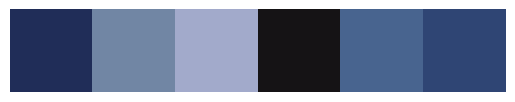

In [8]:
print("Displaying board colors")

unique_colors = list({color for row in board_colors for color in row})
unique_colors_rgb = [[int(c[1:3], 16), int(c[3:5], 16), int(c[5:7], 16)] for c in unique_colors]

img = [unique_colors_rgb]

plt.imshow(img)
plt.axis('off')
plt.show()

## Movimentos iniciais
Leva o robô até a caixa de tinta e retorna à pose inicial.

In [9]:
print("Starting movements")
brush_box.add_ani_frame(time=0, htm=HTM_BRUSH_BOX)
wood_box.add_ani_frame(time=0, htm=HTM_BRUSH_BOX * ub.Utils.trn([0, 0, -0.15]))

num_joints = np.shape(robot.q)[0]
robot_controller = RobotController(robot, num_joints, ACCEL, ANGULAR_TOLERANCE, dt=TIME_STEP)

t = 0  # t inicial

print("Going to the brush box")
t = robot_controller.move_to_position(HTM_BRUSH_BOX_TARGET, t)

print("Returning from the box to the initial position")
t = robot_controller.move_to_position(HTM_ROBOT_INIT, t)

Starting movements
Going to the brush box
Returning from the box to the initial position


## Loop de pintura
Itera pelos pixels do quadro, troca de cor conforme necessário e aplica cada pincelada.

In [10]:

colors = np.transpose(board_colors)
total_pixels = BOARD_SIZE * BOARD_SIZE


with tqdm(total=total_pixels, desc="Processing pixels", unit='pixel') as pbar:
    for j in range(BOARD_SIZE):
        should_stop = False
        for i in range(BOARD_SIZE):
            try:
                color = colors[i][j]
                previous_color = colors[i - 1][j] if i > 0 else colors[BOARD_SIZE - 1][j - 1]

                y_pixel = board.board_base.y + i * board.pixel_size
                z_pixel = board.board_base.z - j * board.pixel_size
                htm_pixel = ub.Utils.trn([board.board_base.x, y_pixel, z_pixel]) * ub.Utils.rotz(np.pi / 2)
                htm_pixel_draw = htm_pixel.copy()

                pixel = ub.Box(color=color, width=board.pixel_size, depth=0.01, height=board.pixel_size, opacity=0.9)
                objects.append(pixel)

                if color == '#ffffff':
                    pixel.add_ani_frame(time=t - 0.1, htm=htm_pixel)
                    pbar.update(1)
                    continue

                should_change_brush = (color != previous_color) and (i != 0 or j != 0)

                if should_change_brush:
                    t = robot_controller.move_to_config(Q_INIT, t)
                    t = robot_controller.move_to_position(HTM_BRUSH_BOX_TARGET, t)
                    t = robot_controller.move_to_config(Q_INIT, t)

                htm_init_paint = htm_pixel_draw * ub.Utils.trn([0, 0,  board.pixel_size/2]) * ub.Utils.rotx(np.pi / 2)
                t = robot_controller.move_to_position(htm_init_paint, t)

                htm_finish_paint = htm_pixel_draw * ub.Utils.trn([0, 0, -board.pixel_size/2]) * ub.Utils.rotx(np.pi / 2)
                t = robot_controller.move_to_position(htm_finish_paint, t)

                pixel.add_ani_frame(time=t, htm=htm_pixel)

            except Exception as e:
                print((i, j))
                print(e)
                should_stop = True
                break

            pbar.update(1)

        try:
            t = robot_controller.move_to_config(Q_INIT, t)
        except Exception as e:
            print((i, j))
            print(e)
            should_stop = True
            break
        if should_stop:
            break

Processing pixels:   0%|          | 0/256 [00:00<?, ?pixel/s]

## Executar simulação
Inicializa o ambiente e roda a animação.

In [12]:
sim = ub.Simulation.create_sim_snow(objects=objects)
sim.run()